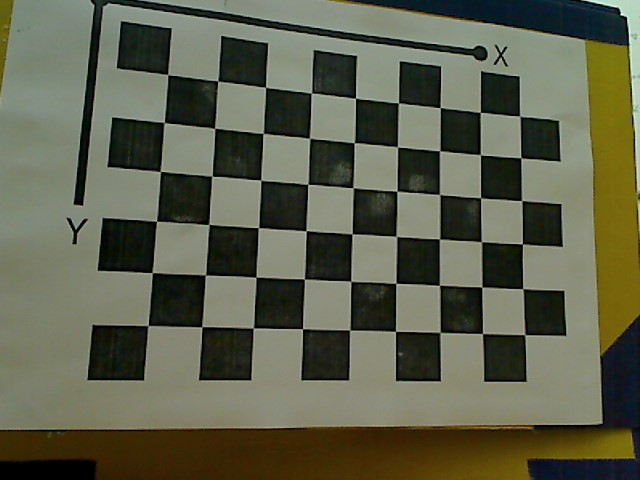

In [0]:
import cv2

from google.colab.patches import cv2_imshow

img = cv2.imread('/content/Im1.jpg')

#cv2_imshow(img)

res_img = img

cv2_imshow(img)

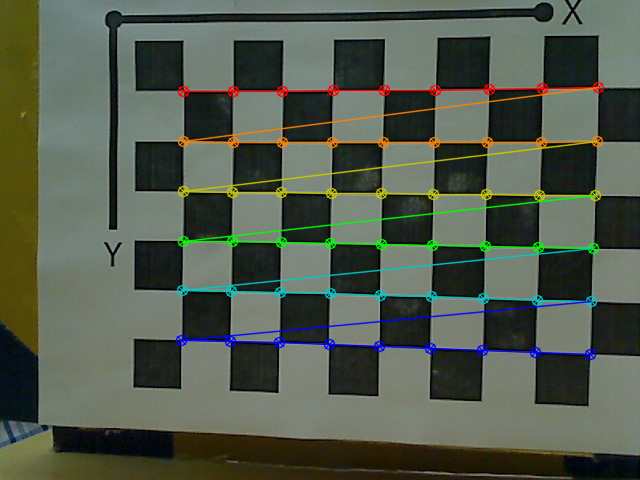

Im13.jpg


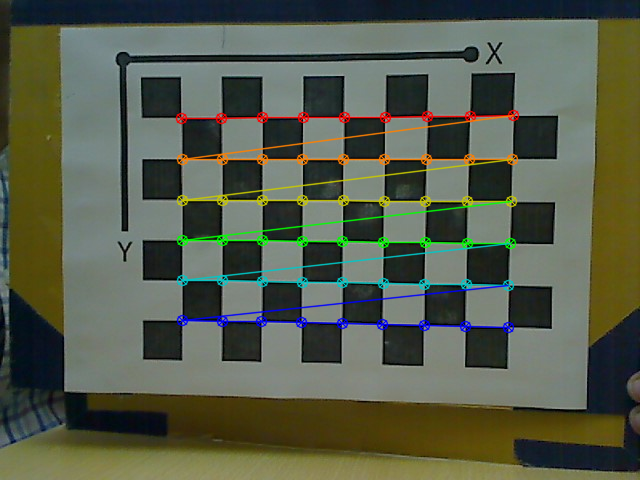

Im6.jpg


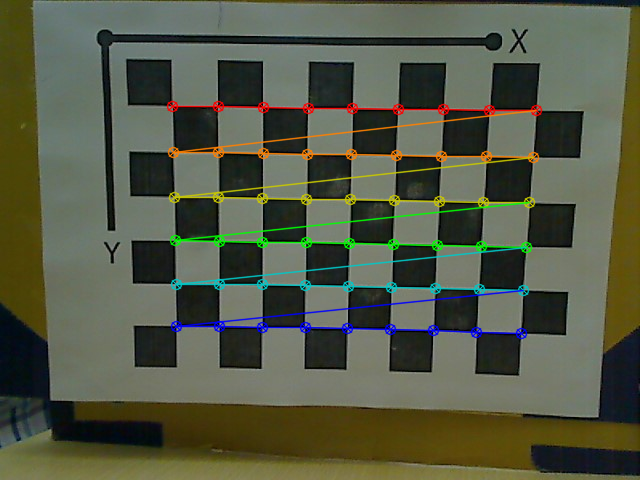

Im4.jpg


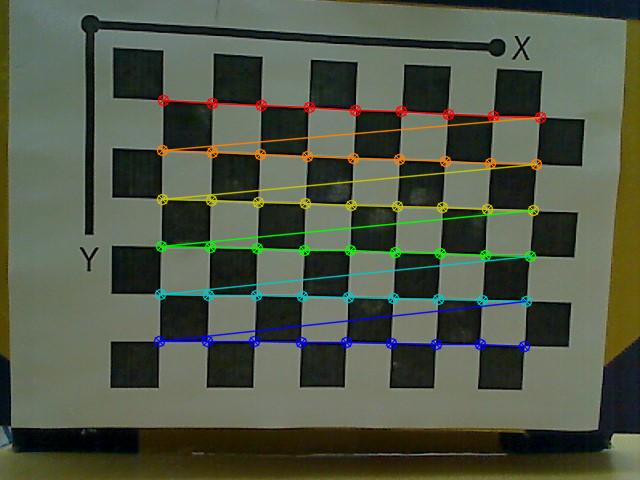

Im18.jpg


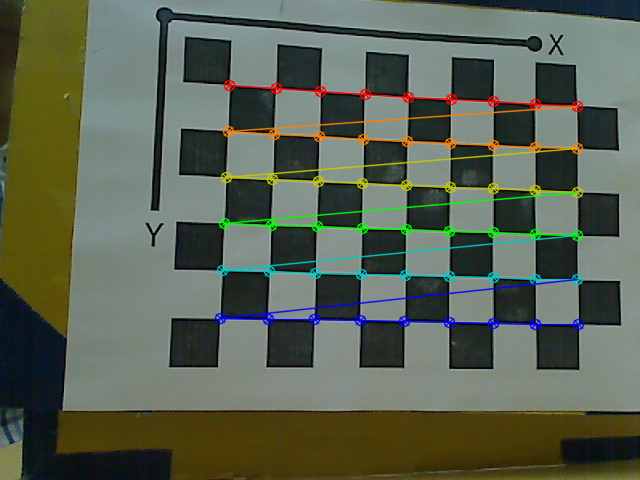

Im17.jpg


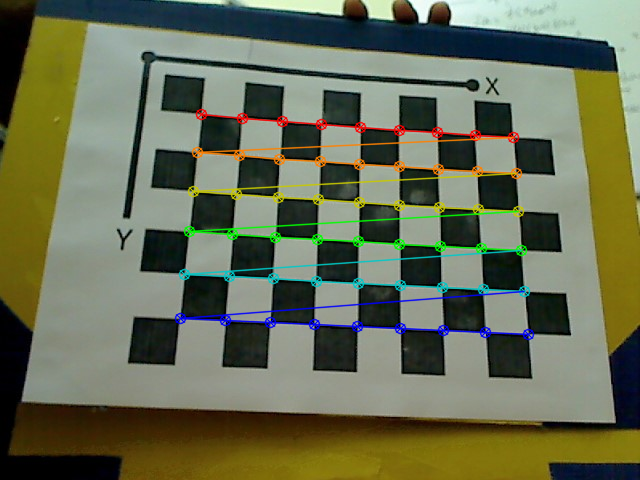

Im3.jpg


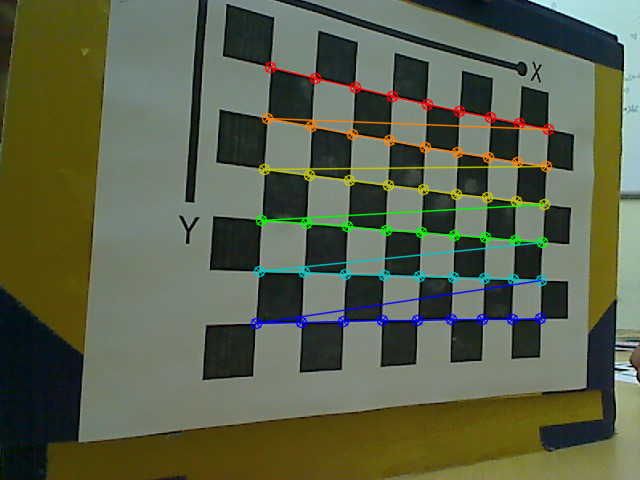

Im16.jpg


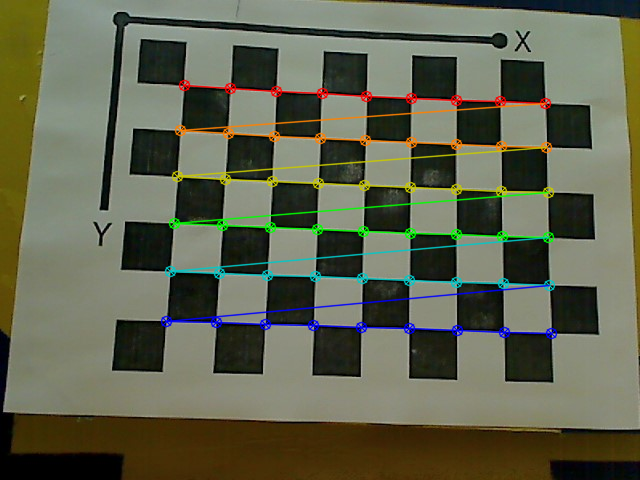

Im2.jpg


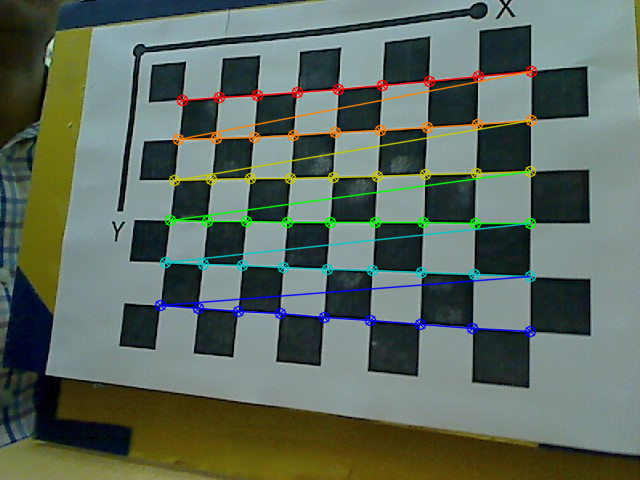

Im11.jpg


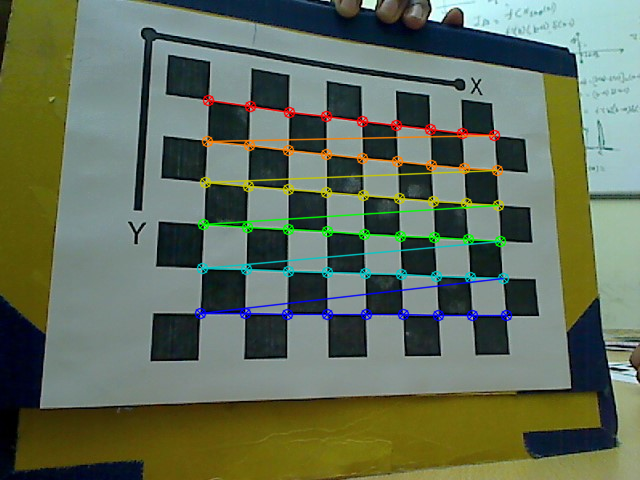

Im15.jpg


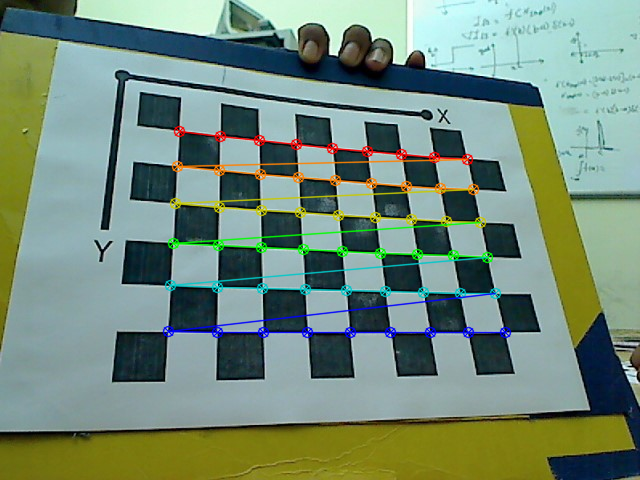

Im19.jpg


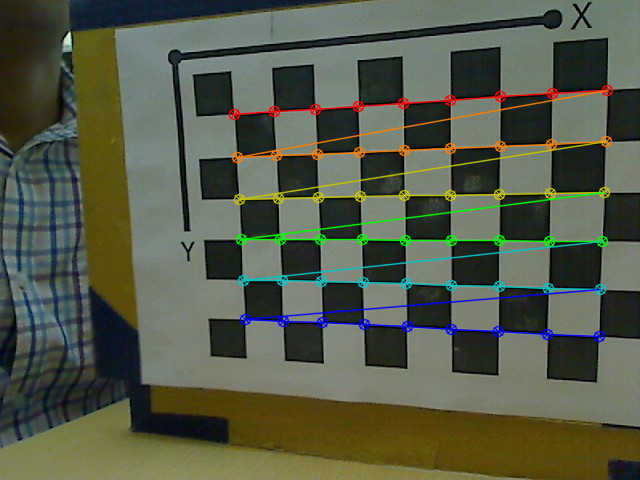

Im5.jpg


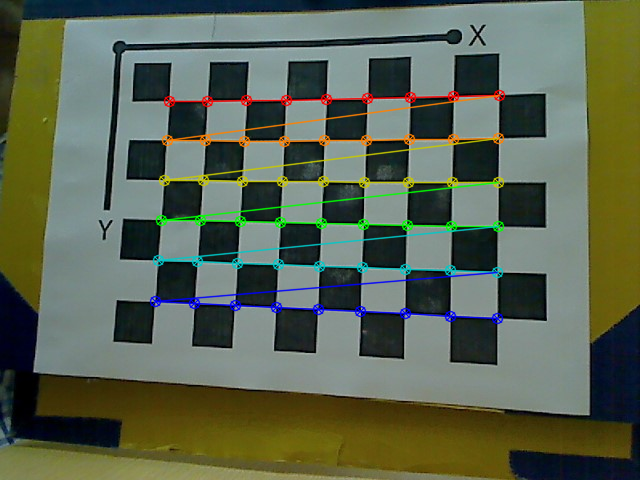

Im10.jpg


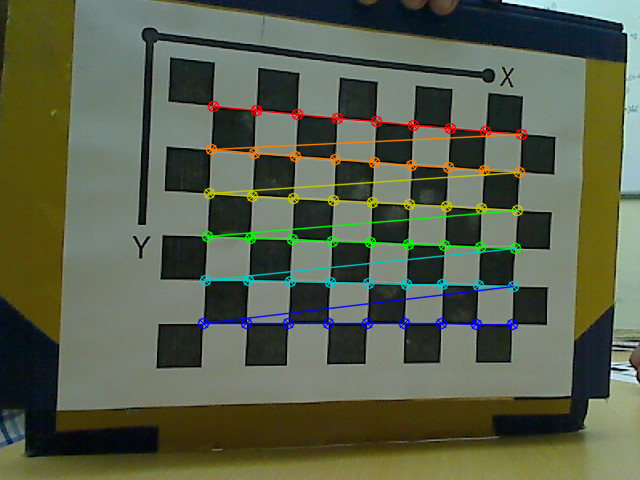

Im14.jpg


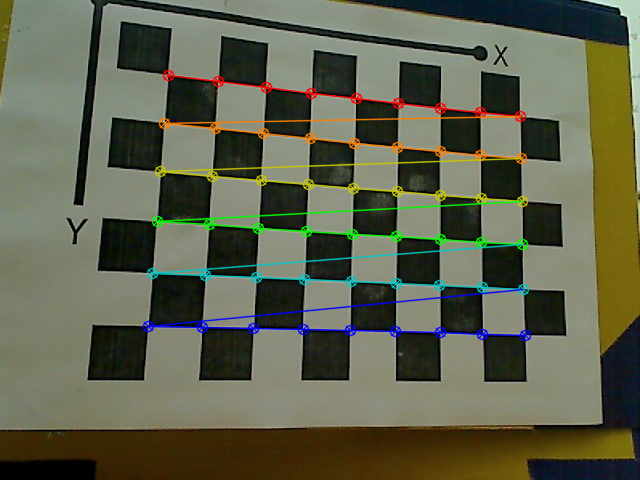

Im1.jpg


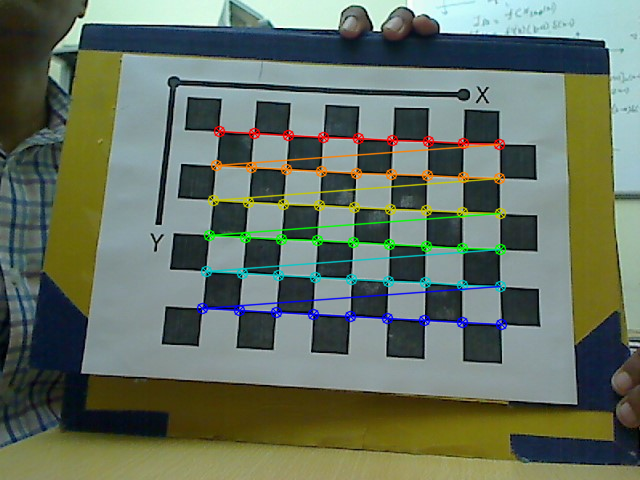

Im7.jpg


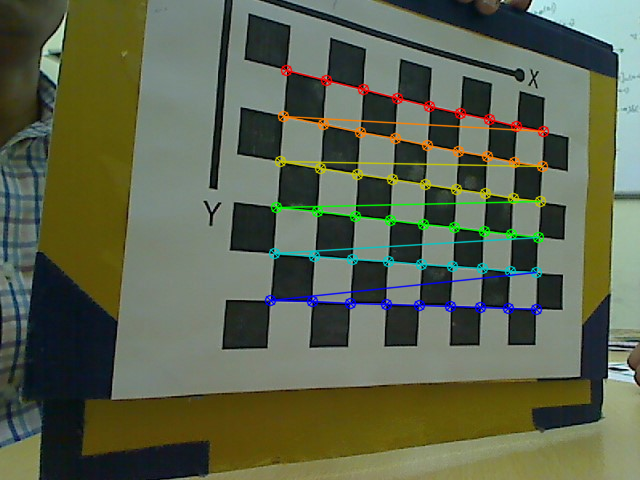

Im9.jpg


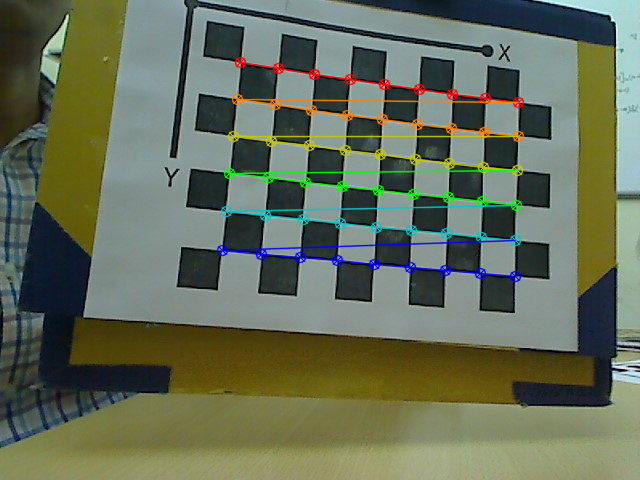

Im8.jpg


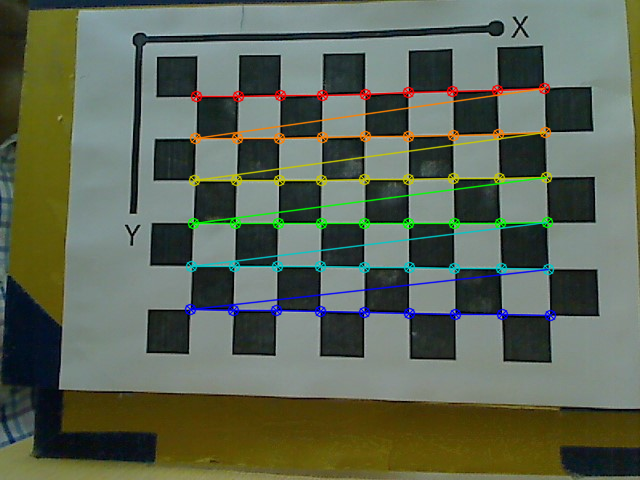

Im12.jpg


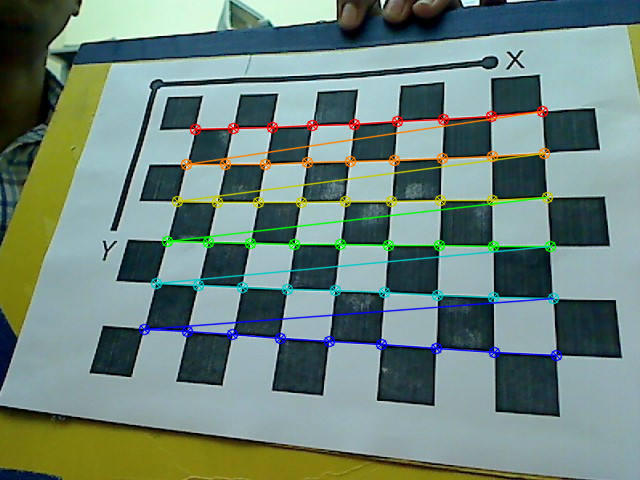

Im20.jpg


In [0]:
import numpy as np
import cv2
import glob

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

images = glob.glob('*.jpg')

for fname in images:
    img = cv2.imread(fname)
    
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    
#     print(fname,ret)
    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners2,ret)
        cv2_imshow(img)
        print(fname)
#         cv2.waitKey(500)

# cv2.destroyAllWindows()

# print(images)

In [0]:

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

In [0]:
print(ret, mtx, dist, rvecs, tvecs)

0.3921989703575771 [[544.7639419    0.         318.40645859]
 [  0.         549.36438592 218.25462863]
 [  0.           0.           1.        ]] [[ 0.11896198 -0.1175462  -0.00837272 -0.00290169 -0.20175268]] [array([[0.0109825 ],
       [0.08280909],
       [0.01578419]]), array([[0.03333807],
       [0.0670221 ],
       [0.00736564]]), array([[0.11780259],
       [0.01890762],
       [0.01705703]]), array([[ 0.06367043],
       [-0.07417787],
       [ 0.03301581]]), array([[-0.09595932],
       [-0.10943565],
       [ 0.03303006]]), array([[-0.30336269],
       [-0.0845137 ],
       [ 0.04792148]]), array([[-0.04890542],
       [-0.49014358],
       [ 0.06793514]]), array([[-0.16258734],
       [-0.04599329],
       [ 0.03774309]]), array([[-0.18445391],
       [ 0.33902815],
       [ 0.03657556]]), array([[-0.20943153],
       [-0.30688029],
       [ 0.03020319]]), array([[-0.46679232],
       [-0.27179349],
       [-0.00453936]]), array([[ 0.11552008],
       [ 0.26279329],
      

In [0]:
rvecs

[array([[0.0109825 ],
        [0.08280909],
        [0.01578419]]), array([[0.03333807],
        [0.0670221 ],
        [0.00736564]]), array([[0.11780259],
        [0.01890762],
        [0.01705703]]), array([[ 0.06367043],
        [-0.07417787],
        [ 0.03301581]]), array([[-0.09595932],
        [-0.10943565],
        [ 0.03303006]]), array([[-0.30336269],
        [-0.0845137 ],
        [ 0.04792148]]), array([[-0.04890542],
        [-0.49014358],
        [ 0.06793514]]), array([[-0.16258734],
        [-0.04599329],
        [ 0.03774309]]), array([[-0.18445391],
        [ 0.33902815],
        [ 0.03657556]]), array([[-0.20943153],
        [-0.30688029],
        [ 0.03020319]]), array([[-0.46679232],
        [-0.27179349],
        [-0.00453936]]), array([[ 0.11552008],
        [ 0.26279329],
        [-0.01906699]]), array([[-0.13223621],
        [ 0.1643733 ],
        [ 0.03047073]]), array([[-0.00516257],
        [-0.2253758 ],
        [ 0.04655044]]), array([[-0.15894353],
      

[233  91] 233 91
[282  91] 282 91
[333  90] 333 90
[384  90] 384 90
[435  90] 435 90
[489  89] 489 89
[542  88] 542 88
[598  87] 598 87
[183 141] 183 141


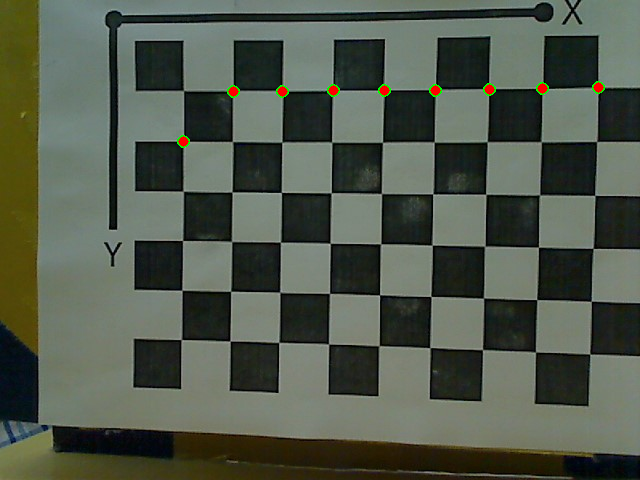

In [0]:
#Fiting the Circles Using HoughCircles

import cv2
import numpy as np
import copy

# img = cv2.imread('/content/Hist5.jpg',0)
# img = cv2.medianBlur(img,5)
cimg =  cv2.imread('/content/Im13.jpg')

# circles = cv2.HoughCircles(cimg,cv2.HOUGH_GRADIENT,1.005,500,param1=200,param2=15,minRadius=10,maxRadius=0)

#cv2_imshow(cimg)
# print(circles)

# print('RED CIRCLE')

circles = np.uint16(np.around(imgpoints[0][1:10]))
                           
for i in circles:
    print(i[0],i[0][0],i[0][1])
    # draw the outer circle
    cv2.circle(cimg,(i[0][0],i[0][1]),5,(0,255,0),2)
    # draw the center of the circle
    cv2.circle(cimg,(i[0][0],i[0][1]),2,(0,0,255),5)

cv2_imshow(cimg)


In [0]:
circles = np.uint16(np.around(objpoints[0][1:10]))
circles

In [0]:
ret

# ***Re-projection Error***

In [0]:
mean_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i],imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    mean_error += error

print("Total Error: ", mean_error/len(objpoints))

In [0]:
img=cv2.imread('/content/Im1.jpg')
img=cv2.resize(img,None,fx=0.75,fy=0.75,interpolation=cv2.INTER_CUBIC)
h,  w = img.shape[:2]
newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))

# undistort
#dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

# undistort
mapx,mapy = cv2.initUndistortRectifyMap(mtx,dist,None,newcameramtx,(w,h),5)
dst = cv2.remap(img,mapx,mapy,cv2.INTER_LINEAR)

# crop the image
x,y,w,h = roi
dst = dst[y:y+h, x:x+w]
cv2_imshow(dst)

In [0]:
dist

array([[ 0.11896198, -0.1175462 , -0.00837272, -0.00290169, -0.20175268]])